<a href="https://colab.research.google.com/github/TillVollmer5/mass_spectroscopy/blob/main/HCA_filtered_unknown_screening.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, dendrogram

drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [2]:
compound_sample_df = pd.read_csv('/content/drive/My Drive/unknown_screening_data/Hitlist_non_dublicates.csv')
compound_sample_df = compound_sample_df.drop(columns='Formula (mol ion)').set_index('Unnamed: 0')
print(compound_sample_df.head())

de_filtered_df = pd.read_csv('/content/drive/My Drive/unknown_screening_data/Filtered_Result_With_Detection_Frequency_02.csv')
print(de_filtered_df.head())
print(de_filtered_df.columns)
print(de_filtered_df.index)
# Set the index to the "Unnamed: 0" column
de_filtered_df = de_filtered_df.drop(columns=['Formula (mol ion)', 'Detection Frequency']).set_index('Unnamed: 0')
print(de_filtered_df.head())

                                                 Auto_5_gp_df  Auto_4_gp_df  \
Unnamed: 0                                                                    
4-Ethylphenylacetylene                                    0.0           0.0   
3-Quinolinecarbonitrile, 5,6,7,8-tetrahydro-              0.0           0.0   
5,6-Dimethyl-1H-1,3-benzodiazole-2-carbaldehyde           0.0           0.0   
2-Cyano-N-(2-hydroxy-5-methylphenyl)acetamide             0.0           0.0   
1-(2-Vinylphenyl)ethanone                                 0.0           0.0   

                                                 Auto_3_gp_df  Auto_2_gp_df  \
Unnamed: 0                                                                    
4-Ethylphenylacetylene                                    0.0           0.0   
3-Quinolinecarbonitrile, 5,6,7,8-tetrahydro-              0.0           0.0   
5,6-Dimethyl-1H-1,3-benzodiazole-2-carbaldehyde           0.0           0.0   
2-Cyano-N-(2-hydroxy-5-methylphenyl)acetamide      

In [3]:
clustered_data = sns.clustermap(compound_sample_df, cmap="Blues", annot=False, fmt=".2f", linewidths=1,
                                cbar_kws={'label': 'Area Ratio'}, vmax=0.25,
                                col_cluster=True, row_cluster=False, figsize=(40, 600), method='ward')

# Customize the plot
clustered_data.cax.set_visible(False)
clustered_data.ax_heatmap.set(ylabel='')

# If you want to save the plot
plt.savefig('/content/drive/My Drive/unknown_screening_data/HCA_plot_heat_filtered.png')

# Show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


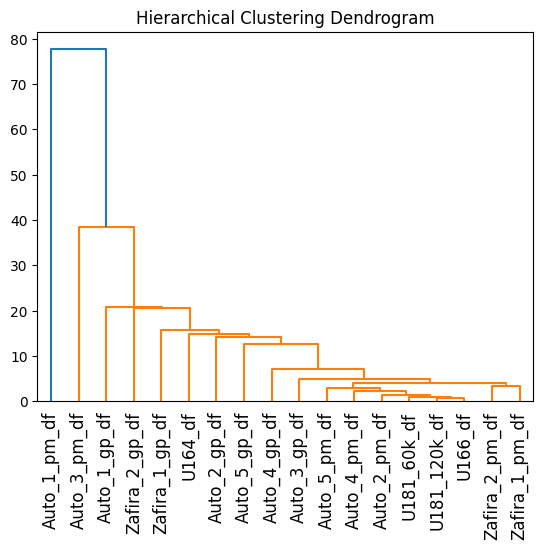

In [4]:
column_labels = compound_sample_df.columns
linkage_matrix = linkage(compound_sample_df.transpose(), method='ward')

# Plot the dendrogram
dendrogram(linkage_matrix, labels=column_labels, orientation='top', leaf_rotation=90)

# Customize the plot
plt.title('Hierarchical Clustering Dendrogram')

# If you want to save the plot
plt.savefig('/content/drive/My Drive/unknown_screening_data/Dendrogram_filtered.png')

# Show the plot
plt.show()

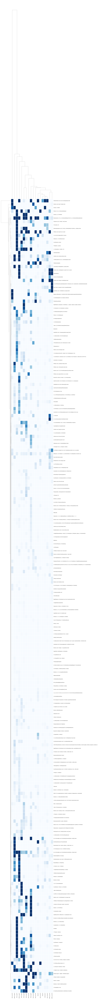

In [10]:
clustered_data = sns.clustermap(de_filtered_df, cmap="Blues", annot=False, fmt=".2f", linewidths=1,
                                cbar_kws={'label': 'Area Ratio'}, vmax=0.25,
                                col_cluster=True, row_cluster=True, figsize=(20, 200), method='ward')

# Customize the plot
clustered_data.cax.set_visible(False)
clustered_data.ax_heatmap.set(ylabel='')

# If you want to save the plot
plt.savefig('/content/drive/My Drive/unknown_screening_data/HCA_plot_heat_filtered_2.png')

# Show the plot
plt.show()

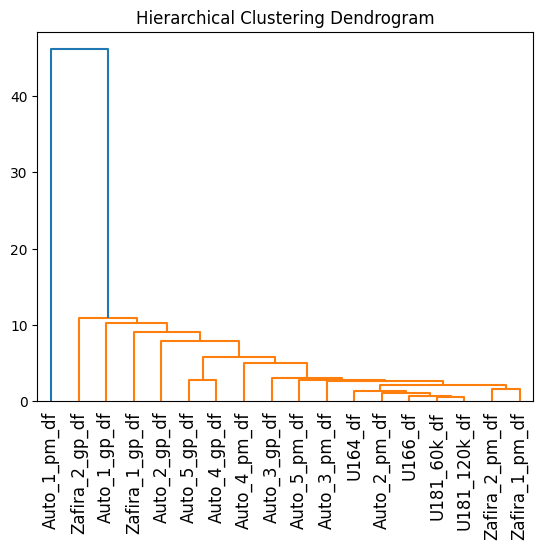

In [9]:
column_labels = de_filtered_df.columns
linkage_matrix = linkage(de_filtered_df.transpose(), method='ward')

# Plot the dendrogram
dendrogram(linkage_matrix, labels=column_labels, orientation='top', leaf_rotation=90)

# Customize the plot
plt.title('Hierarchical Clustering Dendrogram')

# If you want to save the plot
plt.savefig('/content/drive/My Drive/unknown_screening_data/Dendrogram_filtered_2.png')

# Show the plot
plt.show()